In [1]:
import shap
import scipy.stats as stats
from catboost import Pool, CatBoostClassifier
from sklearn.metrics import roc_curve, roc_auc_score
import umap.plot
import umap
import numpy as np
import pandas as pd
from datetime import datetime
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="ticks", color_codes=True)
%matplotlib inline
shap.initjs()

/Users/subir/pythonenv/default/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
plt.rcParams['figure.figsize'] = (8,8)
pd.set_option('display.max_columns', 500)

In [78]:
def plot_umap_for_dataset(df_master, labels , n_neighbors=3):
    mapper = umap.UMAP(n_neighbors=n_neighbors,
                      min_dist=0.3,
                      metric='correlation').fit(df_master.values)
    umap.plot.points(mapper, labels=target, theme='fire')

def create_adversarial_data(df_master):
    df_master = df_master.sample(frac=1)
    adversarial_train = df_master[:len(train_df)]
    adversarial_test = df_master[len(train_df):]
    return adversarial_train, adversarial_test

In [110]:
train_df = pd.read_csv('./load-prediction/train_ctrUa4K.csv')
test_df = pd.read_csv('./load-prediction/test_lAUu6dG.csv')

In [111]:
train_df.head()

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001002,Male,No,0,Graduate,No,5849,0.0,NaN,360.0,1.0,Urban,Y
1,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
2,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
3,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
4,LP001008,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y


In [112]:
train_df['dataset_label'] = 0
test_df['dataset_label'] = 1

In [113]:
train_df.drop(['Loan_ID','Loan_Status'],1,inplace=True)
test_df.drop(['Loan_ID'],1,inplace=True)

In [114]:
df_train = pd.get_dummies(train_df,columns=['Dependents','Gender','Married','Education', 'Self_Employed', 'Credit_History','Property_Area'])

In [115]:
df_test = pd.get_dummies(train_df, columns=['Dependents','Gender','Married','Education', 'Self_Employed', 'Credit_History','Property_Area'])

In [116]:
df_master = train_df.append(test_df)

In [117]:
df_master.shape , train_df.shape , test_df.shape

((981, 12), (614, 12), (367, 12))

In [118]:
target = df_master.dataset_label

In [119]:
df_master = pd.get_dummies(df_master, columns=['Dependents','Gender','Married','Education', 'Self_Employed', 'Credit_History','Property_Area'])

In [120]:
df_master.head()

,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,dataset_label,Dependents_0,Dependents_1,Dependents_2,Dependents_3+,Gender_Female,Gender_Male,Married_No,Married_Yes,Education_Graduate,Education_Not Graduate,Self_Employed_No,Self_Employed_Yes,Credit_History_0.0,Credit_History_1.0,Property_Area_Rural,Property_Area_Semiurban,Property_Area_Urban
0,5849,0.0,NaN,360.0,0,1,0,0,0,0,1,1,0,1,0,1,0,0,1,0,0,1
1,4583,1508.0,128.0,360.0,0,0,1,0,0,0,1,0,1,1,0,1,0,0,1,1,0,0
2,3000,0.0,66.0,360.0,0,1,0,0,0,0,1,0,1,1,0,0,1,0,1,0,0,1
3,2583,2358.0,120.0,360.0,0,1,0,0,0,0,1,0,1,0,1,1,0,0,1,0,0,1
4,6000,0.0,141.0,360.0,0,1,0,0,0,0,1,1,0,1,0,1,0,0,1,0,0,1


In [121]:
df_master = df_master.sample(frac=1)

In [122]:
df_master.fillna(-1,inplace=True)
df_master.drop_duplicates(inplace=True)

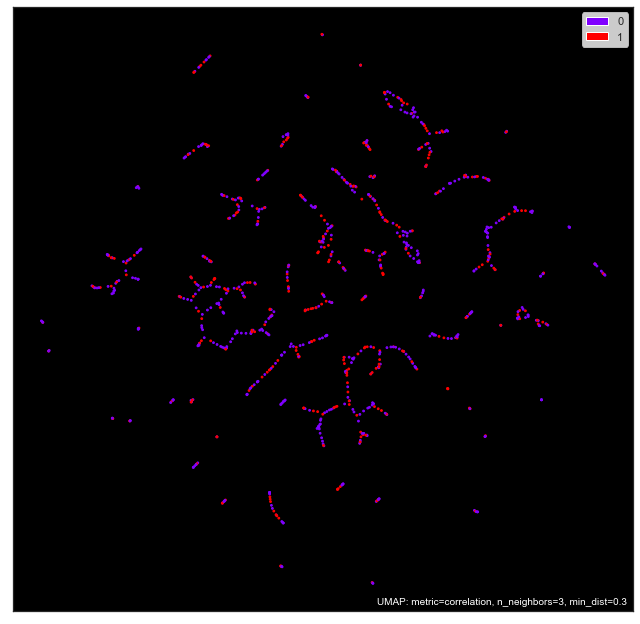

In [36]:
plot_umap_for_dataset(df_master, target)

In [37]:
adversarial_train, adversarial_test = create_adversarial_data(df_master)
adversarial_train.shape, adversarial_test.shape

((614, 22), (366, 22))

In [38]:
adversarial_train.dataset_label.value_counts()

0    372
1    242
Name: dataset_label, dtype: int64

In [39]:
train_data = Pool(
    data=adversarial_train.drop('dataset_label',1),
    label=adversarial_train['dataset_label']
)
holdout_data = Pool(
    data=adversarial_test.drop('dataset_label',1),
    label=adversarial_test['dataset_label']
)

In [40]:
params = {
    'iterations': 500,
    'eval_metric': 'AUC'
}

In [41]:
model = CatBoostClassifier(**params)
_ = model.fit(train_data, eval_set=holdout_data, plot=True, verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [42]:
def plot_roc(y_trues, y_preds, labels, x_max=1.0):
    fig, ax = plt.subplots()
    for i, y_pred in enumerate(y_preds):
        y_true = y_trues[i]
        fpr, tpr, thresholds = roc_curve(y_true, y_pred)
        auc = roc_auc_score(y_true, y_pred)
        ax.plot(fpr, tpr, label='%s; AUC=%.3f' % (labels[i], auc), marker='o', markersize=1)

    ax.legend()
    ax.grid()
    ax.plot(np.linspace(0, 1, 20), np.linspace(0, 1, 20), linestyle='--')
    ax.set_title('ROC curve')
    ax.set_xlabel('False Positive Rate')
    ax.set_xlim([-0.01, x_max])
    _ = ax.set_ylabel('True Positive Rate')

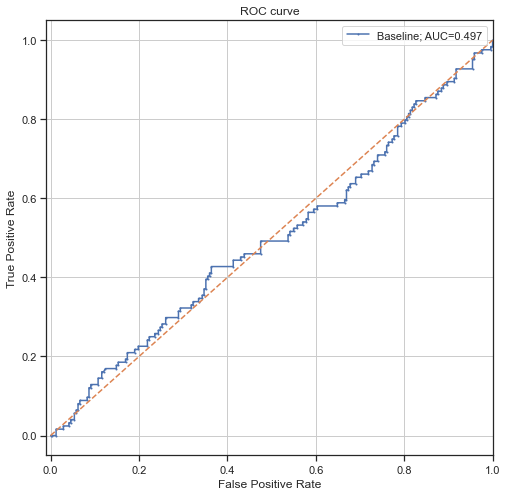

In [43]:

plot_roc(
    [holdout_data.get_label()],
    [model.predict_proba(holdout_data)[:,1]],
    ['Baseline']
)

In [44]:
def plot_importances(model, holdout_data, features):
    shap_values = model.get_feature_importance(holdout_data, type='ShapValues')
    expected_value = shap_values[0,-1]
    shap_values = shap_values[:,:-1]
    shap.summary_plot(shap_values, holdout_data, feature_names=features, plot_type='bar')

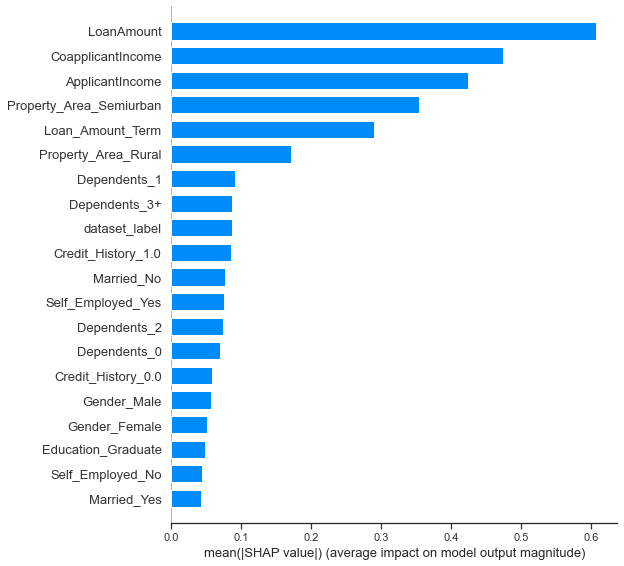

In [45]:
plot_importances(model, holdout_data, df_master.columns.to_list())

In [46]:
params = {
    'iterations': 500,
    'eval_metric': 'AUC'
}

In [67]:
train_df = pd.read_csv('./russian-housing-market/sberbank-russian-housing-market/train.csv')
test_df = pd.read_csv('./russian-housing-market/sberbank-russian-housing-market/test.csv')

In [68]:
train_df.shape , test_df.shape

((30471, 292), (7662, 291))

In [69]:
train_df.head()

,id,timestamp,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,full_all,male_f,female_f,young_all,young_male,young_female,work_all,work_male,work_female,ekder_all,ekder_male,ekder_female,0_6_all,0_6_male,0_6_female,7_14_all,7_14_male,7_14_female,0_17_all,0_17_male,0_17_female,16_29_all,16_29_male,16_29_female,0_13_all,0_13_male,0_13_female,raion_build_count_with_material_info,build_count_block,build_count_wood,build_count_frame,build_count_brick,build_count_monolith,build_count_panel,build_count_foam,build_count_slag,build_count_mix,raion_build_count_with_builddate_info,build_count_before_1920,build_count_1921-1945,build_count_1946-1970,build_count_1971-1995,build_count_after_1995,ID_metro,metro_min_avto,metro_km_avto,metro_min_walk,metro_km_walk,kindergarten_km,school_km,park_km,green_zone_km,industrial_km,water_treatment_km,cemetery_km,incineration_km,railroad_station_walk_km,railroad_station_walk_min,ID_railroad_station_walk,railroad_station_avto_km,railroad_station_avto_min,ID_railroad_station_avto,public_transport_station_km,public_transport_station_min_walk,water_km,water_1line,mkad_km,ttk_km,sadovoe_km,bulvar_ring_km,kremlin_km,big_road1_km,ID_big_road1,big_road1_1line,big_road2_km,ID_big_road2,railroad_km,railroad_1line,zd_vokzaly_avto_km,ID_railroad_terminal,bus_terminal_avto_km,ID_bus_terminal,oil_chemistry_km,nuclear_reactor_km,radiation_km,power_transmission_line_km,thermal_power_plant_km,ts_km,big_market_km,market_shop_km,fitness_km,swim_pool_km,ice_rink_km,stadium_km,basketball_km,hospice_morgue_km,detention_facility_km,public_healthcare_km,university_km,workplaces_km,shopping_centers_km,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,mosque_km,theater_km,museum_km,exhibition_km,catering_km,ecology,green_part_500,prom_part_500,office_count_500,office_sqm_500,trc_count_500,trc_sqm_500,cafe_count_500,cafe_sum_500_min_price_avg,cafe_sum_500_max_price_avg,cafe_avg_price_500,cafe_count_500_na_price,cafe_count_500_price_500,cafe_count_500_price_1000,cafe_count_500_price_1500,cafe_count_500_price_2500,cafe_count_500_price_4000,cafe_count_500_price_high,big_church_count_500,church_count_500,mosque_count_500,leisure_count_500,sport_count_500,market_count_500,green_part_1000,prom_part_1000,office_count_1000,office_sqm_1000,trc_count_1000,trc_sqm_1000,cafe_count_1000,cafe_sum_1000_min_price_avg,cafe_sum_1000_max_price_avg,cafe_avg_price_1000,cafe_count_1000_na_price,cafe_count_1000_price_500,cafe_count_1000_price_1000,cafe_count_1000_price_1500,cafe_count_1000_price_2500,cafe_count_1000_price_4000,cafe_count_1000_price_high,big_church_count_1000,church_count_1000,mosque_count_1000,leisure_count_1000,sport_count_1000,market_count_1000,green_part_1500,prom_part_1500,office_count_1500,office_sqm_1500,trc_count_1500,trc_sqm_1500,cafe_count_1500,cafe_sum_1500_min_price_avg,cafe_sum_1500_max_price_avg,cafe_avg_price_1500,cafe_count_1500_na_price,cafe_count_1500_price_500,cafe_count_1500_price_1000,cafe_count_1500_price_1500,cafe_count_1500_price_2500,cafe_count_1500_price_4000,cafe_count_1500_price_high,big_church_count_1500,church_count_1500,mosque_count_1500,leisure_count_1500,sport_count_1500,market_count_1500,green_part_2000,prom_part_2000,office_count_2000,office_sqm_2000,trc_count_2000,trc_sqm_2000,cafe_count_2000,cafe_sum_2000_min_price_avg,cafe_sum_2000_max_price_av

In [70]:
train_df.columns

Index(['id', 'timestamp', 'full_sq', 'life_sq', 'floor', 'max_floor',
       'material', 'build_year', 'num_room', 'kitch_sq',
       ...
       'cafe_count_5000_price_2500', 'cafe_count_5000_price_4000',
       'cafe_count_5000_price_high', 'big_church_count_5000',
       'church_count_5000', 'mosque_count_5000', 'leisure_count_5000',
       'sport_count_5000', 'market_count_5000', 'price_doc'],
      dtype='object', length=292)

In [71]:
id_train = train_df['id']
time_train = train_df['timestamp']
ytrain = train_df['price_doc']
train_df.drop(['id', 'timestamp', 'price_doc'], axis = 1, inplace = True)
train_df.fillna(-1, inplace = True)

In [72]:

id_test = test_df['id']            
time_test = test_df['timestamp']
test_df.drop(['id', 'timestamp'], axis = 1, inplace = True)

In [73]:
# add identifier and combine
train_df['dataset_label'] = 1
test_df['dataset_label'] = 0
df_master = pd.concat([train_df, test_df], axis = 0)

In [74]:
cat_cols=df_master.select_dtypes(include='object').columns.to_list()

In [75]:
df_master = pd.get_dummies(df_master,
                           columns=cat_cols)

In [76]:
df_master.fillna(-1,inplace=True)
df_master.drop_duplicates(inplace=True)

In [80]:
target = df_master.dataset_label

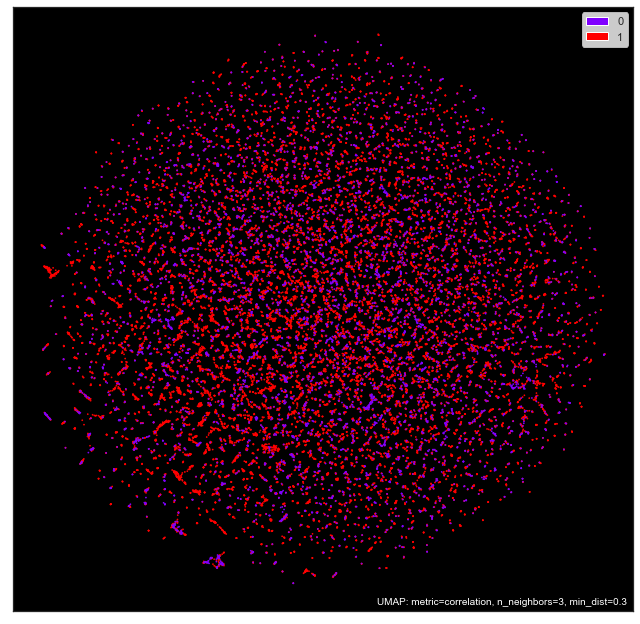

In [81]:
plot_umap_for_dataset(df_master, target)

In [57]:
adversarial_train, adversarial_test = create_adversarial_data(df_master)
adversarial_train.shape, adversarial_test.shape

((30471, 452), (6494, 452))

In [82]:
adversarial_train['build_year']

7996       -1.0
7908       -1.0
427      1982.0
25475    1962.0
17989    1962.0
          ...  
8127       -1.0
21559      -1.0
2233     2005.0
2845       -1.0
1445     2017.0
Name: build_year, Length: 30471, dtype: float64

In [58]:
train_data = Pool(
    data=adversarial_train.drop('dataset_label',1),
    label=adversarial_train['dataset_label']
)
holdout_data = Pool(
    data=adversarial_test.drop('dataset_label',1),
    label=adversarial_test['dataset_label']
)

In [59]:
all_col = df_master.columns.tolist()
all_col.remove('dataset_label')

In [60]:
model = CatBoostClassifier(**params)
_ = model.fit(train_data, eval_set=holdout_data, plot=True, verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

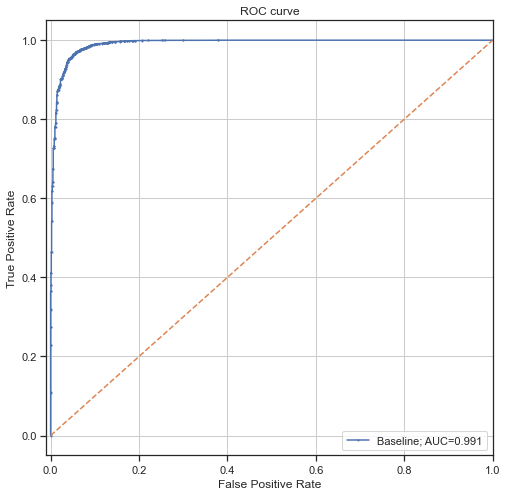

In [61]:

plot_roc(
    [holdout_data.get_label().astype('int')],
    [model.predict_proba(holdout_data)[:,1]],
    ['Baseline']
)

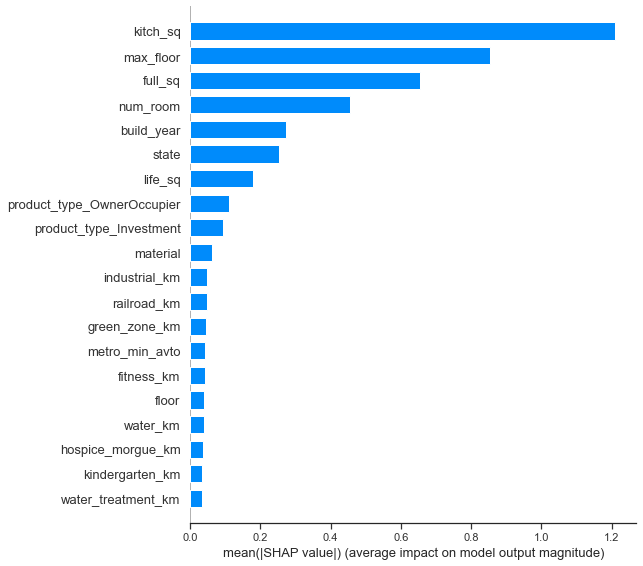

In [62]:
plot_importances(model, holdout_data, all_col)

In [83]:
params2 = dict(params)
params2.update({"ignored_features": ['build_year','state']})
model2 = CatBoostClassifier(**params2)
_ = model2.fit(train_data, eval_set=holdout_data, plot=True, verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

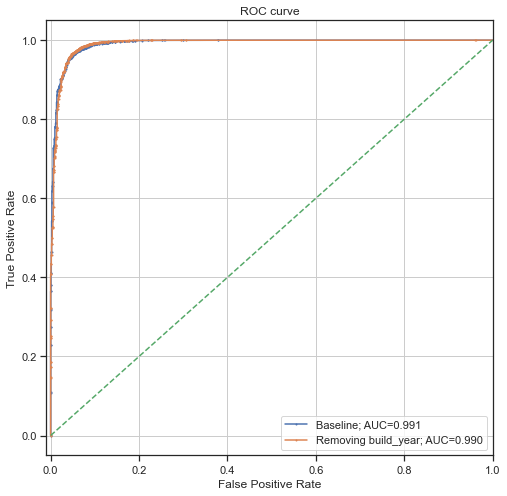

In [84]:
plot_roc(
    [holdout_data.get_label()]*2,
    [model.predict_proba(holdout_data)[:,1], model2.predict_proba(holdout_data)[:,1]],
    ['Baseline', 'Removing build_year']
)

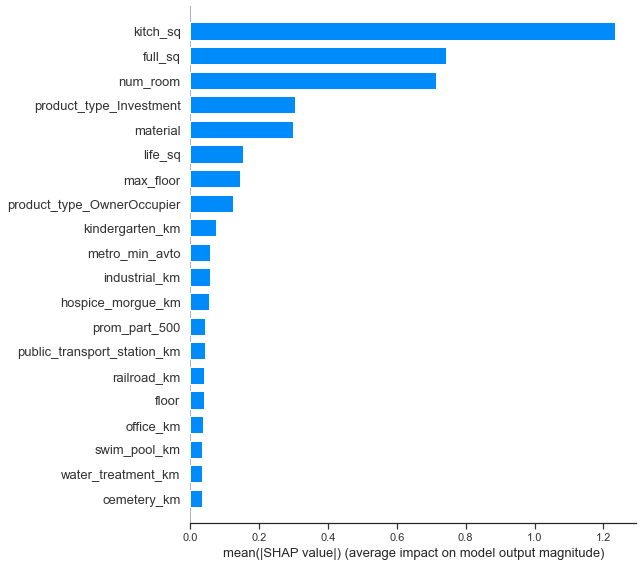

In [85]:
plot_importances(model2, holdout_data, all_col)

In [86]:
from ast import literal_eval
import plotly.offline as py
py.init_notebook_mode(connected = True)
import plotly.graph_objs as go
colors = ['rgb(0,31,63)', 'rgb(255,133,27)', 'rgb(255,65,54)', 'rgb(0,116,217)', 'rgb(133,20,75)', 'rgb(57,204,204)',
'rgb(240,18,190)', 'rgb(46,204,64)', 'rgb(1,255,112)', 'rgb(255,220,0)',
'rgb(76,114,176)', 'rgb(85,168,104)', 'rgb(129,114,178)', 'rgb(100,181,205)']
data_graph = []

In [123]:
reduce = umap.UMAP(random_state = 223) #just for reproducibility
df_master.dropna(inplace=True)
embedding = reduce.fit_transform(df_master)

In [124]:
embedding.shape , len(df_master['dataset_label'].values.reshape(-1,1))

((980, 2), 980)

In [125]:
df = pd.DataFrame(embedding, columns=('x', 'y'))
df["class"] = df_master['dataset_label'].values.reshape(-1,1)

In [126]:
df.head()

,x,y,class
0,2.157607,8.999131,0
1,2.580078,11.289556,0
2,15.799738,-3.145869,1
3,5.102077,7.977493,0
4,-4.160955,0.181293,1


/Users/subir/pythonenv/default/lib/python3.7/site-packages/seaborn/axisgrid.py:2065: UserWarning:

The `size` parameter has been renamed to `height`; pleaes update your code.



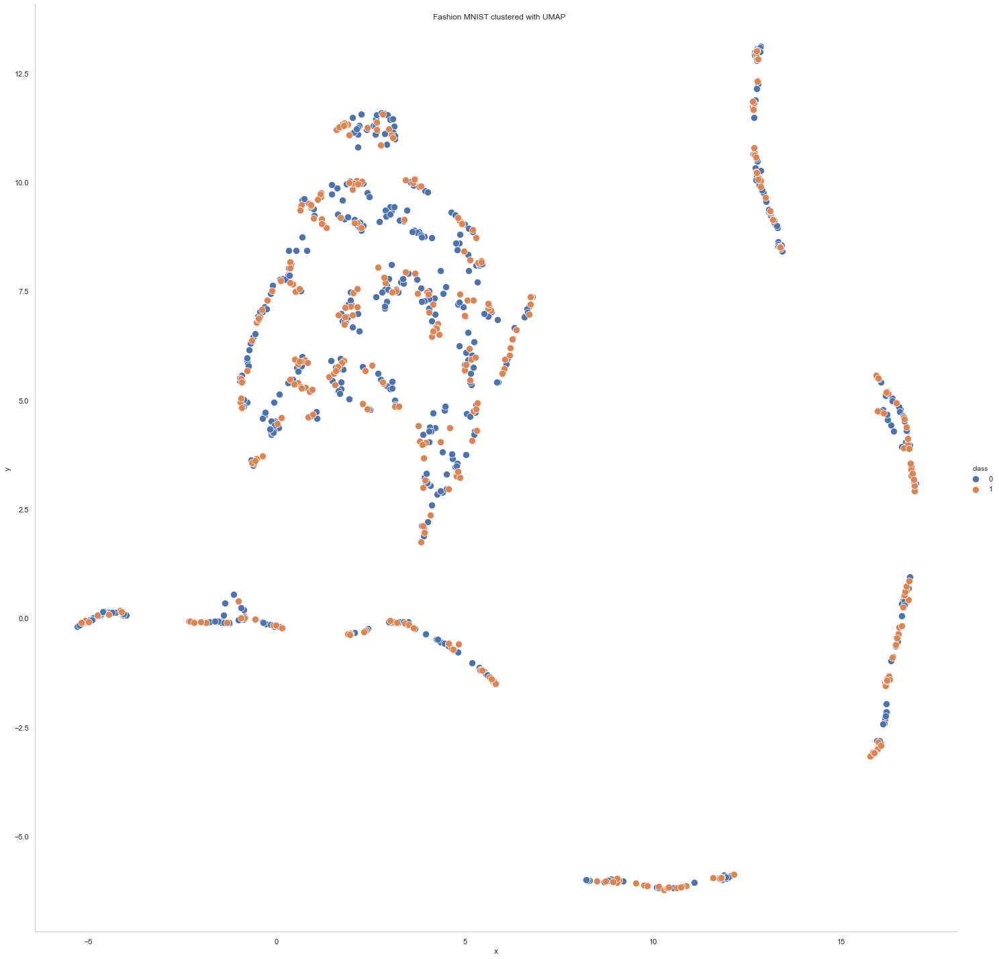

In [127]:
sns.set_style("whitegrid", {'axes.grid' : False})
#adjusting plot dots with plot_kws
ax = sns.pairplot(x_vars = ["x"], y_vars = ["y"],data = df, 
             hue = "class",size=20, plot_kws={"s":104});
ax.fig.suptitle('Fashion MNIST clustered with UMAP') ;

In [128]:
for no, name in enumerate(np.unique(df["class"])):
    graph = go.Scatter3d(
    x = df[df["class"] == name]["x"],
    y = df[df["class"] == name]["y"],
    z = df[df["class"] == name]["class"],
    name = no,
    mode = 'markers',
    marker = dict(
        size = 12,
        line = dict(
            color = '#%02x%02x%02x' % literal_eval(colors[no][3:]),
            width = 0.5
            ),
        opacity = 0.5
        )
    )
    data_graph.append(graph)
    
    
layout = go.Layout(
    scene = dict(
        camera = dict(
            eye = dict(
            x = 0.5,
            y = 0.5,
            z = 0.5
            )
        )
    ),
    margin = dict(
        l = 0,
        r = 0,
        b = 0,
        t = 0
    )
)
fig = go.Figure(data = data_graph, layout = layout)
py.iplot(fig, filename = '3d-scatter')